In [1]:
! python run_monodepth.py

initialize
device: cuda
start processing
  processing input/cl_resize.png (1/1)
/opt/conda/lib/python3.8/site-packages/torch/nn/functional.py:3451: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
finished


In [26]:
import numpy as np
import re
import sys
import struct
import PIL.Image

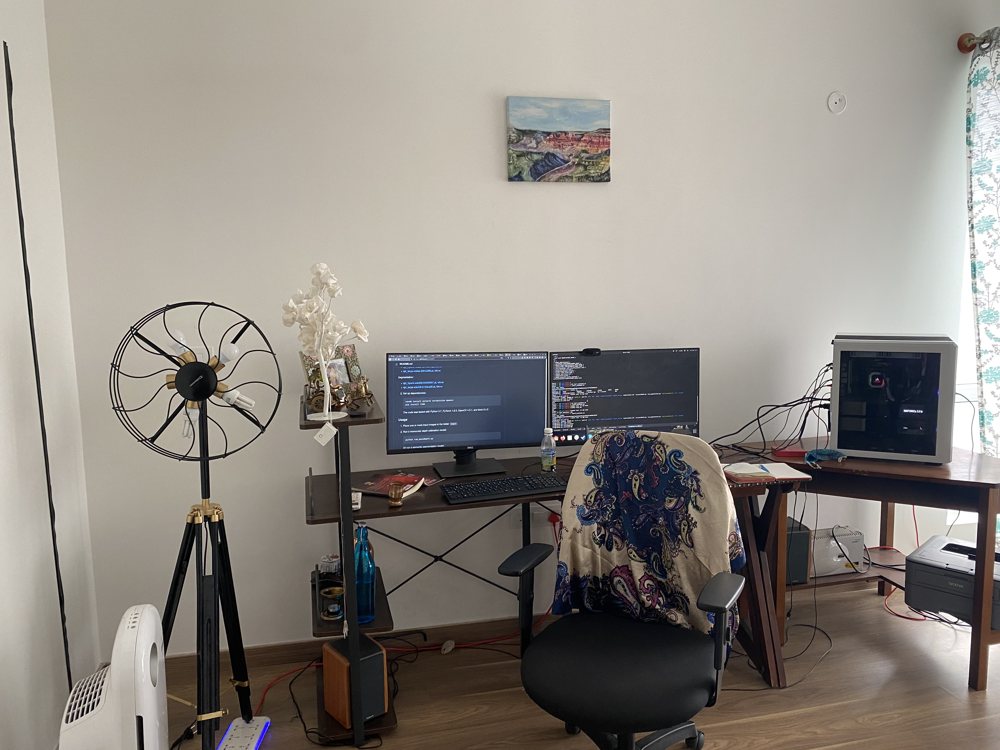

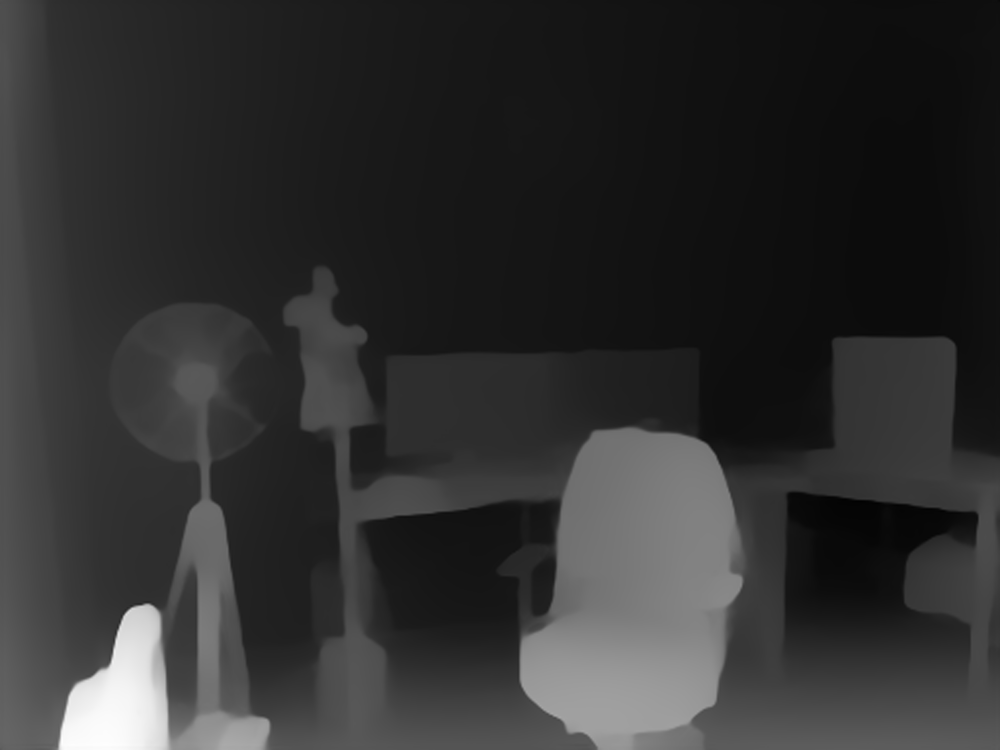

In [25]:
import PIL.Image
import numpy as np

rgb_path = "/tf/input_cache/IMG-3098.jpg"
rgb_image = PIL.Image.open(rgb_path)
rgb_array = np.asarray(rgb_image)
display(rgb_image)
depth_path = '/tf/output_monodepth/IMG-3098.png'
depth_image = PIL.Image.open(depth_path)
depth_array = np.asarray(depth_image)
PIL.Image.fromarray(depth_array)

In [27]:
import cv2

def pointcloud(depth, fov):
    fy = fx = 0.5 / np.tan(fov * 0.5) # assume aspectRatio is one.
    height = depth.shape[0]
    width = depth.shape[1]

    mask = np.where(depth > 0)

    x = mask[1]
    y = mask[0]

    normalized_x = (x.astype(np.float32) - width * 0.5) / width
    normalized_y = (y.astype(np.float32) - height * 0.5) / height

    world_x = normalized_x * depth[y, x] / fx
    world_y = normalized_y * depth[y, x] / fy
    world_z = depth[y, x]
    ones = np.ones(world_z.shape[0], dtype=np.float32)

    return np.vstack((world_x, world_y, world_z, ones)).T

def get_focal_length_in_px(HFOV, image_shape):
    """
    Inputs:
    HFOV, Horizontal FOV in degrees
    image_shape, (h,w)
    returns focal length in pixels for camera matrix
    """
    h = image_shape[0]
    w = image_shape[1]

    VFOV = 2 * np.arctan((h / w) * np.tan((HFOV / 2) * np.pi / 180.0))
    f_x = (w / 2) / (np.tan((HFOV / 2) * np.pi / 180.0))
    f_y = (h / 2) / (np.tan(VFOV / 2))
    return f_x, f_y


def save_point_cloud(depth, rgb, ply_path, HFOV):
    # point cloud 
    points = []
    w = depth.shape[1]
    h = depth.shape[0]
    fx, fy = get_focal_length_in_px(HFOV, (h, w))
    ply_file = ply_path + 'point_cloud.ply'
    curr_depth = depth
    im = cv2.resize(rgb, (w, h))
    # depth_rgb
    for v in range(curr_depth.shape[1]):
        for u in range(curr_depth.shape[0]):
            color = im[u, v]
            Z = curr_depth[u, v]
            X = (u - np.int(w / 2)) * Z / fx
            Y = (v - np.int(h / 2)) * Z / fy
            points.append("%f %f %f %d %d %d 0\n" % (X, Y, Z, color[0], color[1], color[2]))

    # save point cloud to file
    file = open(ply_file, "w")
    headers = ["ply", 
               "format ascii 1.0", 
               f"element vertex {len(points)}", 
               "property float x",
               "property float y",
               "property float z",
               "property uchar red",
               "property uchar green",
               "property uchar blue",
               "property uchar alpha",
               "end_header"]
    file.write("\n".join(headers) + "\n" + "".join(points))
    file.close()
    print("> Point Cloud saved to file: " + str(ply_file))
    print("> You can open and visualize it by opening it using Meshlab!")

In [28]:
def read_pfm(path):
    """Read pfm file.
    Args:
        path (str): path to file
    Returns:
        tuple: (data, scale)
    """
    with open(path, "rb") as file:

        color = None
        width = None
        height = None
        scale = None
        endian = None

        header = file.readline().rstrip()
        if header.decode("ascii") == "PF":
            color = True
        elif header.decode("ascii") == "Pf":
            color = False
        else:
            raise Exception("Not a PFM file: " + path)

        dim_match = re.match(r"^(\d+)\s(\d+)\s$", file.readline().decode("ascii"))
        if dim_match:
            width, height = list(map(int, dim_match.groups()))
        else:
            raise Exception("Malformed PFM header.")

        scale = float(file.readline().decode("ascii").rstrip())
        if scale < 0:
            # little-endian
            endian = "<"
            scale = -scale
        else:
            # big-endian
            endian = ">"

        data = np.fromfile(file, endian + "f")
        shape = (height, width, 3) if color else (height, width)

        data = np.reshape(data, shape)
        data = np.flipud(data)

        return data, scale

In [32]:
print(f"Input RGB Shape: {rgb_array.shape}")
prediction_array, scale = read_pfm('/tf/output_monodepth/IMG-3098.pfm')
print(f"Input D Shape: {prediction_array.shape}")

Input RGB Shape: (3024, 4032, 3)
Input D Shape: (3024, 4032)


In [40]:
disp_data = np.asarray(prediction_array)
depth = (1/disp_data)
x_0 = 2258.1494
x_1 = 0.9344
depth = depth * x_0 + x_1
print(depth.min(), depth.max())
depth = np.clip(depth, 0.1, 40)

1.6609603 32.908195


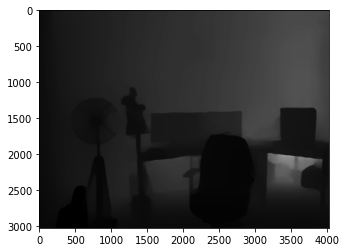

In [41]:
import matplotlib.pyplot as plt
plt.imshow(depth, cmap='gray')

In [42]:
save_point_cloud(depth, rgb_array, 'room_', 60)

> Point Cloud saved to file: room_point_cloud.ply
> You can open and visualize it by opening it using Meshlab!


In [56]:
! head -n30 room_1point_cloud.ply

ply
format ascii 1.0
element vertex 12192768
property float x
property float y
property float z
property uchar red
property uchar green
property uchar blue
property uchar alpha
end_header
-0.511275 -0.383456 0.357998 192 188 176 0
-0.511021 -0.383456 0.357998 193 189 177 0
-0.511237 -0.383809 0.358328 196 192 180 0
-0.512392 -0.384866 0.359315 197 193 181 0
-0.514953 -0.386982 0.361291 196 192 180 0
-0.517511 -0.389098 0.363266 195 191 179 0
-0.521004 -0.391919 0.365900 195 191 179 0
-0.524493 -0.394740 0.368534 194 190 178 0
-0.527979 -0.397562 0.371168 193 189 177 0
-0.531460 -0.400383 0.373801 194 190 178 0
-0.534939 -0.403204 0.376435 194 190 178 0
-0.537945 -0.405672 0.378740 195 191 179 0
-0.540481 -0.407788 0.380715 197 193 181 0
-0.542080 -0.409199 0.382032 198 194 182 0
-0.542743 -0.409904 0.382691 199 195 183 0
-0.542939 -0.410257 0.383020 200 196 184 0
-0.542668 -0.410257 0.383020 197 193 181 0
-0.541930 -0.409904 0.382691 196 192 180 0
-0.541659 -0.409904 0.382691 194 190 1

In [32]:
pointcloud(depth_array, 90)

array([[-3.8002219e+04, -3.8002219e+04,  2.3461416e+04,  1.0000000e+00],
       [-3.7983367e+04, -3.8002219e+04,  2.3461416e+04,  1.0000000e+00],
       [-3.7999430e+04, -3.8037168e+04,  2.3482992e+04,  1.0000000e+00],
       ...,
       [ 3.8386238e+03,  3.8418020e+03,  2.3733816e+03,  1.0000000e+00],
       [ 3.8012524e+03,  3.8025107e+03,  2.3491084e+03,  1.0000000e+00],
       [ 3.8162393e+03,  3.8156077e+03,  2.3571995e+03,  1.0000000e+00]],
      dtype=float32)

In [28]:
depth_array

array([[23461.416 , 23461.416 , 23482.992 , ..., 22749.402 , 22749.402 ,
        22749.402 ],
       [23461.416 , 23439.84  , 23461.416 , ..., 22749.402 , 22749.402 ,
        22749.402 ],
       [23482.992 , 23461.416 , 23504.57  , ..., 22749.402 , 22749.402 ,
        22749.402 ],
       ...,
       [20289.717 , 20289.717 , 20289.717 , ...,  2386.8667,  2365.2905,
         2373.3816],
       [20300.504 , 20300.504 , 20300.504 , ...,  2365.2905,  2341.0173,
         2349.1084],
       [20289.717 , 20300.504 , 20289.717 , ...,  2373.3816,  2349.1084,
         2357.1995]], dtype=float32)

In [57]:
! ls /tf/output_monodepth

IMG-3097.png  IMG-3098.pfm  IMG-3098.ply  IMG-3098.png


In [81]:
depth_value.dtype

dtype('float64')